# Object Detection Demo: City Network of Capture Points
Welcome to the object detection inference walkthrough!  This notebook will walk you step by step through the process of using a pre-trained model to detect objects in an image. Make sure to follow the [installation instructions](https://github.com/tensorflow/models/blob/master/object_detection/g3doc/installation.md) before you start.

<img src="img/dogneuralnetwork.png"></img>

# Imports

In [135]:
import numpy as np
import os
import six.moves.urllib as urllib
import sys
import tarfile
import tensorflow as tf
import zipfile
import getpass

from collections import defaultdict
from io import StringIO
from matplotlib import pyplot as plt
from PIL import Image

from PIL import ImageGrab
import time
import pandas as pd

import cv2

import requests
from io import BytesIO

import time

## Env setup

In [136]:
# This is needed to display the images.
%matplotlib inline

# This is needed since the notebook is stored in the object_detection folder.
sys.path.append("..")

## Object detection imports
Here are the imports from the object detection module.

In [137]:
from utils import label_map_util

from utils import visualization_utils as vis_util

# Model preparation 

## Variables

Any model exported using the `export_inference_graph.py` tool can be loaded here simply by changing `PATH_TO_CKPT` to point to a new .pb file.  

By default we use an "SSD with Mobilenet" model here. See the [detection model zoo](https://github.com/tensorflow/models/blob/master/object_detection/g3doc/detection_model_zoo.md) for a list of other models that can be run out-of-the-box with varying speeds and accuracies.

### Model: SSD Mobilenet on COCO

In [205]:
# What model to download.
MODEL_NAME = 'ssd_mobilenet_v1_coco_11_06_2017'
MODEL_FILE = MODEL_NAME + '.tar.gz'
DOWNLOAD_BASE = 'http://download.tensorflow.org/models/object_detection/'

# Path to frozen detection graph. This is the actual model that is used for the object detection.
PATH_TO_CKPT = MODEL_NAME + '/frozen_inference_graph.pb'

# List of the strings that is used to add correct label for each box.
PATH_TO_LABELS = os.path.join('data', 'mscoco_label_map.pbtxt')

NUM_CLASSES = 90

### Model: SSD Inception on COCO

In [52]:
# What model to download.
MODEL_NAME = 'ssd_inception_v2_coco_2017_11_17'
MODEL_FILE = MODEL_NAME + '.tar.gz'
DOWNLOAD_BASE = 'http://download.tensorflow.org/models/object_detection/'

# Path to frozen detection graph. This is the actual model that is used for the object detection.
PATH_TO_CKPT = MODEL_NAME + '/frozen_inference_graph.pb'

# List of the strings that is used to add correct label for each box.
PATH_TO_LABELS = os.path.join('data', 'mscoco_label_map.pbtxt')

NUM_CLASSES = 90

### Model: Faster RCNN ResNet101 on Kitti 

In [138]:
# What model to download.
MODEL_NAME = 'faster_rcnn_resnet101_kitti_2018_01_28'
MODEL_FILE = MODEL_NAME + '.tar.gz'
DOWNLOAD_BASE = 'http://download.tensorflow.org/models/object_detection/'

# Path to frozen detection graph. This is the actual model that is used for the object detection.
PATH_TO_CKPT = MODEL_NAME + '/frozen_inference_graph.pb'

# List of the strings that is used to add correct label for each box.
PATH_TO_LABELS = os.path.join('data', 'pascal_label_map.pbtxt')

NUM_CLASSES = 20

# Download Model

In [139]:
# opener = urllib.request.URLopener()
# opener.retrieve(DOWNLOAD_BASE + MODEL_FILE, MODEL_FILE)
# tar_file = tarfile.open(MODEL_FILE)
# for file in tar_file.getmembers():
#     file_name = os.path.basename(file.name)
#     if 'frozen_inference_graph.pb' in file_name:
#         tar_file.extract(file, os.getcwd())

## Load a (frozen) Tensorflow model into memory.

In [206]:
detection_graph = tf.Graph()
with detection_graph.as_default():
    od_graph_def = tf.GraphDef()
    with tf.gfile.GFile(PATH_TO_CKPT, 'rb') as fid:
        serialized_graph = fid.read()
        od_graph_def.ParseFromString(serialized_graph)
        tf.import_graph_def(od_graph_def, name='')

## Loading label map
Label maps map indices to category names, so that when our convolution network predicts `5`, we know that this corresponds to `airplane`.  Here we use internal utility functions, but anything that returns a dictionary mapping integers to appropriate string labels would be fine

In [207]:
label_map = label_map_util.load_labelmap(PATH_TO_LABELS)
categories = label_map_util.convert_label_map_to_categories(label_map, max_num_classes=NUM_CLASSES, use_display_name=True)
category_index = label_map_util.create_category_index(categories)

In [208]:
category_index

{1: {'id': 1, 'name': 'person'},
 2: {'id': 2, 'name': 'bicycle'},
 3: {'id': 3, 'name': 'car'},
 4: {'id': 4, 'name': 'motorcycle'},
 5: {'id': 5, 'name': 'airplane'},
 6: {'id': 6, 'name': 'bus'},
 7: {'id': 7, 'name': 'train'},
 8: {'id': 8, 'name': 'truck'},
 9: {'id': 9, 'name': 'boat'},
 10: {'id': 10, 'name': 'traffic light'},
 11: {'id': 11, 'name': 'fire hydrant'},
 13: {'id': 13, 'name': 'stop sign'},
 14: {'id': 14, 'name': 'parking meter'},
 15: {'id': 15, 'name': 'bench'},
 16: {'id': 16, 'name': 'bird'},
 17: {'id': 17, 'name': 'cat'},
 18: {'id': 18, 'name': 'dog'},
 19: {'id': 19, 'name': 'horse'},
 20: {'id': 20, 'name': 'sheep'},
 21: {'id': 21, 'name': 'cow'},
 22: {'id': 22, 'name': 'elephant'},
 23: {'id': 23, 'name': 'bear'},
 24: {'id': 24, 'name': 'zebra'},
 25: {'id': 25, 'name': 'giraffe'},
 27: {'id': 27, 'name': 'backpack'},
 28: {'id': 28, 'name': 'umbrella'},
 31: {'id': 31, 'name': 'handbag'},
 32: {'id': 32, 'name': 'tie'},
 33: {'id': 33, 'name': 'suitc

## Helper code

In [209]:
def load_image_into_numpy_array(image):
  (im_width, im_height) = image.size
  return np.array(image.getdata()).reshape(
      (im_height, im_width, 3)).astype(np.uint8)

This is a helper function that takes the detection graph output tensor (np arrays), stacks the classes and scores, and determines if the class for a person (1) is available within a certain score and within a certain amount of objects

In [210]:
def object_counter(classes_arr, scores_arr, score_thresh=0.5):
    # Process the numpy array of classes from the model
    stacked_arr = np.stack((classes_arr, scores_arr), axis=-1)
    # Convert to pandas dataframe for easier querying
    detection_df = pd.DataFrame(stacked_arr)
    # Retrieve total count of cars with score threshold above param value
    detected_cars = detection_df[(detection_df[0] == 3.0) & (detection_df[1] > score_thresh)]
    detected_people =  detection_df[(detection_df[0] == 1.0) & (detection_df[1] > score_thresh)]
    detected_bicycles =  detection_df[(detection_df[0] == 2.0) & (detection_df[1] > score_thresh)]
    detected_motorcycles =  detection_df[(detection_df[0] == 4.0) & (detection_df[1] > score_thresh)]
    detected_buses =  detection_df[(detection_df[0] == 6.0) & (detection_df[1] > score_thresh)]
    detected_trucks =  detection_df[(detection_df[0] == 8.0) & (detection_df[1] > score_thresh)]
    
    car_count = len(detected_cars)
    people_count = len(detected_people)
    bicycle_count = len(detected_bicycles)
    motorcycle_count = len(detected_motorcycles)
    bus_count = len(detected_buses)
    truck_count = len(detected_trucks)

    return car_count, people_count, bicycle_count, motorcycle_count, bus_count, truck_count

# Network Camera Processing

In [310]:
# TrafficLand API source JSON
source_json = r"http://api.trafficland.com/v1.5/json/video_feeds?system=ddot&key=1594c8892d7fbd18181a8a6a44958b28"

In [311]:
df = pd.read_json(source_json)
df

,content,createdAt,description,location,name,orientation,policy,provider,providerFullName,publicId,status,updatedAt
0,{'halfJpeg': 'http://ie.trafficland.com/v1.0/2...,1434662178697,None,"{'cityCode': 'WAS', 'cityName': 'Washington', ...",I-66 e/o Sudley Rd,EAST,"{'isAdmin': False, 'refreshRate': 2000}",VDOT,Virginia DOT,20,"{'isDisabled': False, 'hasQualityWarning': False}",1485736691577
1,{'halfJpeg': 'http://ie.trafficland.com/v1.0/3...,1435687260210,None,"{'cityCode': 'WAS', 'cityName': 'Washington', ...",I-66 @ Virginia Visitor Center,EAST,"{'isAdmin': False, 'refreshRate': 2000}",VDOT,Virginia DOT,30,"{'isDisabled': False, 'hasQualityWarning': False}",1453828214719
2,{'halfJpeg': 'http://ie.trafficland.com/v1.0/4...,1434737139006,None,"{'cityCode': 'WAS', 'cityName': 'Washington', ...",I-66 East of 234 Business,EAST,"{'isAdmin': False, 'refreshRate': 2000}",VDOT,Virginia DOT,40,"{'isDisabled': False, 'hasQualityWarning': False}",1453479512331
3,{'halfJpeg': 'http://ie.trafficland.com/v1.0/5...,1435631718151,None,"{'cityCode': 'WAS', 'cityName': 'Washington', ...",I-66 e/o Compton Rd,EAST,"{'isAdmin': False, 'refreshRate': 2000}",VDOT,Virginia DOT,50,"{'isDisabled': False, 'hasQualityWarning': False}",1451137927983
4,{'halfJpeg': 'http://ie.trafficland.com/v1.0/6...,1435620924132,None,"{'cityCode': 'WAS', 'cityName': 'Washington', ...",I-66 @ Rt-29,EAST,"{'isAdmin': False, 'refreshRate': 2000}",VDOT,Virginia DOT,60,"{'isDisabled': False, 'hasQualityWarning': False}",1453806855092
5,{'halfJpeg': 'http://ie.trafficland.com/v1.0/7...,1435620956761,None,"{'cityCode': 'WAS', 'cityName': 'Washington', ...",I-66 @ Rt-28,EAST,"{'isAdmin': False, 'refreshRate': 2000}",VDOT,Virginia DOT,70,"{'isDisabled': False, 'hasQualityWarning': False}",1453481361428
6,{'halfJpeg': 'http://ie.trafficland.com/v1.0/8...,1435620986719,None,"{'cityCode': 'WAS', 'cityName': 'Washington', ...",Rt-28 s/o I-66,NORTH,"{'isAdmin': False, 'refreshRate': 2000}",VDOT,Virginia DOT,80,"{'isDisabled': False, 'hasQualityWarning': False}",1453483858111
7,{'halfJpeg': 'http://ie.trafficland.com/v1.0/9...,1435621013188,None,"{'cityCode': 'WAS', 'cityName': 'Washington', ...",I-66 @ North Stringfellow Rd,NORTH,"{'isAdmin': False, 'refreshRate': 2000}",VDOT,Virginia DOT,90,"{'isDisabled': False, 'hasQualityWarning': False}",1452337606698
8,{'halfJpeg': 'http://ie.trafficland.com/v1.0/1...,1435687243031,None,"{'cityCode': 'WAS', 'cityName': 'Washington', ...",I-66 @ Fairfax County Parkway,EAST,"{'isAdmin': False, 'refreshRate': 2000}",VDOT,Virginia DOT,100,"{'isDisabled': False, 'hasQualityWarning': True}",1453483857517
9,{'halfJpeg': 'http://ie.trafficland.com/v1.0/1...,1435621051831,None,"{'cityCode': 'WAS', 'cityName': 'Washington', ...",I-66 @ Fairfax Co Pkwy,EAST,"{'isAdmin': False, 'refreshRate': 2000}",VDOT,Virginia DOT,110,"{'isDisabled': False, 'hasQualityWarning': False}",1453485406907


In [312]:
df.shape

(714, 12)

In [327]:
ddot_df = df.loc[df.provider == 'DDOT']
ddot_df

,content,createdAt,description,location,name,orientation,policy,provider,providerFullName,publicId,status,updatedAt
215,{'halfJpeg': 'http://ie.trafficland.com/v1.0/2...,1420732661508,None,"{'cityCode': 'WAS', 'cityName': 'Washington', ...",K St @ 17th St & Conneticut Ave,WEST,"{'isAdmin': False, 'refreshRate': 2000}",DDOT,District of Columbia DOT,200001,"{'isDisabled': False, 'hasQualityWarning': True}",1473442821241
216,{'halfJpeg': 'http://ie.trafficland.com/v1.0/2...,1410381553029,None,"{'cityCode': 'WAS', 'cityName': 'Washington', ...",New Hampshire Ave @ Georgia Ave,SOUTH,"{'isAdmin': False, 'refreshRate': 2000}",DDOT,District of Columbia DOT,200002,"{'isDisabled': False, 'hasQualityWarning': False}",1473442837977
217,{'halfJpeg': 'http://ie.trafficland.com/v1.0/2...,1410381584896,None,"{'cityCode': 'WAS', 'cityName': 'Washington', ...",M St @ Francis Scott Key Brdg,WEST,"{'isAdmin': False, 'refreshRate': 2000}",DDOT,District of Columbia DOT,200003,"{'isDisabled': False, 'hasQualityWarning': False}",1473442847933
218,{'halfJpeg': 'http://ie.trafficland.com/v1.0/2...,1420749104062,None,"{'cityCode': 'WAS', 'cityName': 'Washington', ...",M St @ S Capitol St,EAST,"{'isAdmin': False, 'refreshRate': 2000}",DDOT,District of Columbia DOT,200004,"{'isDisabled': False, 'hasQualityWarning': False}",1473442869524
219,{'halfJpeg': 'http://ie.trafficland.com/v1.0/2...,1410381400497,None,"{'cityCode': 'WAS', 'cityName': 'Washington', ...",Florida Ave @ New York Ave,WEST,"{'isAdmin': False, 'refreshRate': 2000}",DDOT,District of Columbia DOT,200005,"{'isDisabled': False, 'hasQualityWarning': False}",1473442883854
220,{'halfJpeg': 'http://ie.trafficland.com/v1.0/2...,1447105847684,None,"{'cityCode': 'WAS', 'cityName': 'Washington', ...",Eastern Ave @ Kenilworth Ave,EAST,"{'isAdmin': False, 'refreshRate': 2000}",DDOT,District of Columbia DOT,200006,"{'isDisabled': False, 'hasQualityWarning': False}",1473442897132
221,{'halfJpeg': 'http://ie.trafficland.com/v1.0/2...,1410381665549,None,"{'cityCode': 'WAS', 'cityName': 'Washington', ...",4th St @ New York Ave,SOUTH,"{'isAdmin': False, 'refreshRate': 2000}",DDOT,District of Columbia DOT,200007,"{'isDisabled': False, 'hasQualityWarning': False}",1473442909339
222,{'halfJpeg': 'http://ie.trafficland.com/v1.0/2...,1410381743127,None,"{'cityCode': 'WAS', 'cityName': 'Washington', ...",14th St Brdg,NORTH,"{'isAdmin': False, 'refreshRate': 2000}",DDOT,District of Columbia DOT,200009,"{'isDisabled': False, 'hasQualityWarning': False}",1473442924345
223,{'halfJpeg': 'http://ie.trafficland.com/v1.0/2...,1410381770318,None,"{'cityCode': 'WAS', 'cityName': 'Washington', ...",Ist St @ Delaware Ave,WEST,"{'isAdmin': False, 'refreshRate': 2000}",DDOT,District of Columbia DOT,200011,"{'isDisabled': False, 'hasQualityWarning': False}",1473442938691
224,{'halfJpeg': 'http://ie.trafficland.com/v1.0/2...,1410381794915,None,"{'cityCode': 'WAS', 'cityName': 'Washington', ...",Georgia Ave @ Irving St,SOUTH,"{'isAdmin': False, 'refreshRate': 2000}",DDOT,District of Columbia DOT,200012,"{'isDisabled': False, 'hasQualityWarning': False}",1473442951559


In [328]:
ddot_df.iloc[1]['location']

{'cityCode': 'WAS',
 'cityName': 'Washington',
 'countryCode': 'US',
 'countryName': 'United States',
 'latitude': 38.936701,
 'longitude': -77.024232,
 'stateCode': 'DC',
 'stateName': 'District of Columbia',
 'zipCode': '20507'}

In [315]:
test_url = ddot_df.iloc[1]['content']['hugeJpeg']
test_url

'http://ie.trafficland.com/v1.0/200002/huge?system=ddot&pubtoken=80a881c238a169cf2495a77dca1ebf32b5acc39afbd4bc45f0b995c01f7d6259&refreshRate=2000'

In [316]:
def return_lat(row):
    return row['location']['latitude']

def return_lon(row):
    return row['location']['longitude']

In [317]:
# Edit the ddot_df to make a feature service using the API
ddot_df['latitude'] = ddot_df.apply(lambda row: return_lat(row), axis=1)
ddot_df['longitude'] = ddot_df.apply(lambda row: return_lon(row), axis=1)

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  
C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  This is separate from the ipykernel package so we can avoid doing imports until


In [323]:
workspace = r"C:\Users\albe9057\Documents\ANieto_SolutionEngineering\Projects\FedGIS\FedGIS_2018\Plenary_MachineLearning\Inputs"
ddot_df.to_csv(workspace+"\ddot_cameras.csv")
ddot_csv = workspace+"\ddot_cameras.csv"

In [324]:
ddot_csv

'C:\\Users\\albe9057\\Documents\\ANieto_SolutionEngineering\\Projects\\FedGIS\\FedGIS_2018\\Plenary_MachineLearning\\Inputs\\ddot_cameras.csv'

In [217]:
# Establish Network Dictionary
network_dictionary = {
    "camera_01": {
        "camera_url": ddot_df.iloc[0]['content']['hugeJpeg'],
        "feature_id": r"01",
        "location_lat": r"",
        "location_lon": r""
    },
    "camera_02": {
        "camera_url": ddot_df.iloc[1]['content']['hugeJpeg'],
        "feature_id": r"02",
        "location_lat": r"",
        "location_lon": r""
    },
    "camera_03": {
        "camera_url": ddot_df.iloc[2]['content']['hugeJpeg'],
        "feature_id": r"03",
        "location_lat": r"",
        "location_lon": r""
    },
    "camera_04": {
        "camera_url": ddot_df.iloc[3]['content']['hugeJpeg'],
        "feature_id": r"04",
        "location_lat": r"",
        "location_lon": r""
    },
    "camera_05": {
        "camera_url": ddot_df.iloc[4]['content']['hugeJpeg'],
        "feature_id": r"05",
        "location_lat": r"",
        "location_lon": r""
    },    
}

In [152]:
# # Establish Network Dictionary
# network_dictionary = {
#     "camera_01": {
#         "camera_url": r"http://ie.trafficland.com/v1.0/200138/full?system=ddot&pubtoken=0ca6e9940dd85f0b6277fe436ebc448eee6628e06a4df01f743c3b6a0d47f928&refreshRate=2000&t=1519339469668",
#         "feature_id": r"01",
#         "location_lat": r"",
#         "location_lon": r""
#     },
#     "camera_02": {
#         "camera_url": r"http://ie.trafficland.com/v1.0/200145/full?system=ddot&pubtoken=39e6a3d10f05230138bcc3a0651b908de9d1d57fbd69d93b260f085ee8e0d30e&refreshRate=2000&t=1519328676083",
#         "feature_id": r"02",
#         "location_lat": r"",
#         "location_lon": r""
#     },
#     "camera_03": {
#         "camera_url": r"http://ie.trafficland.com/v1.0/200137/full?system=ddot&pubtoken=4ef9133cf977da8b140949d0dda0d35e51b78f927356f6f1644e23f84e167fee&refreshRate=2000&t=1519328689269",
#         "feature_id": r"03",
#         "location_lat": r"",
#         "location_lon": r""
#     },
#     "camera_04": {
#         "camera_url": r"http://ie.trafficland.com/v1.0/200126/full?system=ddot&pubtoken=0547a1d98de2be5d763d24792f2ad052a5f5c0f89285b30f8d1e7e3d9e9f70dc&refreshRate=2000&t=1519328705331",
#         "feature_id": r"04",
#         "location_lat": r"",
#         "location_lon": r""
#     },
#     "camera_05": {
#         "camera_url": r"http://ie.trafficland.com/v1.0/200111/full?system=ddot&pubtoken=7e91905881b3ac56bbdcb226ad0ad00ce6af26a983a92bdc316dcdc7fa2fb412&refreshRate=2000&t=1519328718491",
#         "feature_id": r"05",
#         "location_lat": r"",
#         "location_lon": r""
#     },    
# }

###### Single Camera Prototyping

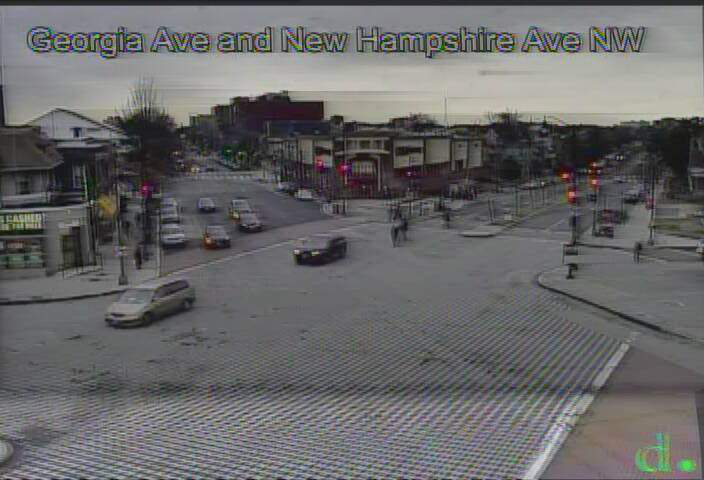

In [218]:
test_url = network_dictionary["camera_02"]["camera_url"]
response = requests.get(test_url)
img = Image.open(BytesIO(response.content))
img

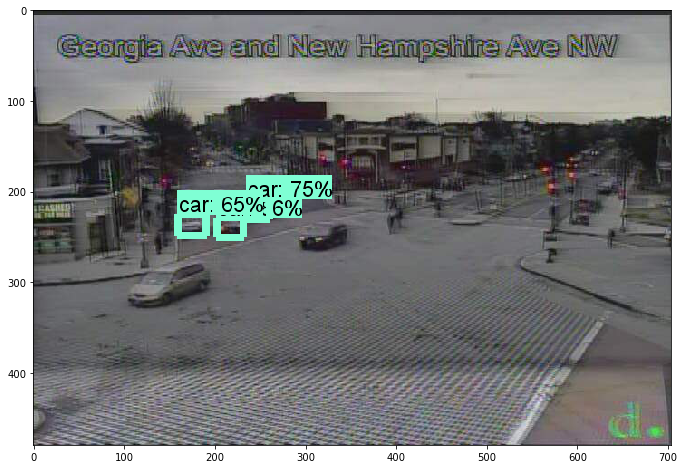

In [219]:
# Size, in inches, of the output images.
IMAGE_SIZE = (12, 8)

with detection_graph.as_default():
    with tf.Session(graph=detection_graph) as sess:
        image_tensor = detection_graph.get_tensor_by_name('image_tensor:0')
        detection_boxes = detection_graph.get_tensor_by_name('detection_boxes:0')
        detection_scores = detection_graph.get_tensor_by_name('detection_scores:0')
        detection_classes = detection_graph.get_tensor_by_name('detection_classes:0')
        num_detections = detection_graph.get_tensor_by_name('num_detections:0')
        image_np = load_image_into_numpy_array(img)
        image_np_expanded = np.expand_dims(image_np, axis=0)
        (boxes, scores, classes, num) = sess.run(
              [detection_boxes, detection_scores, detection_classes, num_detections],
              feed_dict={image_tensor: image_np_expanded})
        vis_util.visualize_boxes_and_labels_on_image_array(
              image_np,
              np.squeeze(boxes),
              np.squeeze(classes).astype(np.int32),
              np.squeeze(scores),
              category_index,
              use_normalized_coordinates=True,
              line_thickness=8)
        plt.figure(figsize=IMAGE_SIZE)
        plt.imshow(image_np)        

###### Multiple Camera Iteration Prototyping

In [284]:
# Size, in inches, of the output images.
IMAGE_SIZE = (12, 8)
jpeg_size = "halfJpeg" # Other Options: halfJpeg; fullJpeg; hugeJpeg

Option: Build Dict of downloaded jpeg arrays, then pass to model in subsequent cell

In [287]:
%%time
# Set up a list of numpy arrays that contain each camera's image
camera_img_nparrays_dict = {}

# Iterate on each item in the source_json 
for ix in range(5):
    camera_url = ddot_df.iloc[ix]['content'][jpeg_size]
    camera_lat = ddot_df.iloc[ix]['location']['latitude']
    camera_lat = ddot_df.iloc[ix]['location']['longitude']
    camera_name = ddot_df.iloc[ix]['name']
    camera_id = ddot_df.iloc[ix]['publicId']
    
    camera_response = requests.get(camera_url)
    camera_img = Image.open(BytesIO(camera_response.content))
    camera_img_nparr = load_image_into_numpy_array(camera_img)
    camera_img_nparrext = np.expand_dims(camera_img_nparr, axis=0)  
    
    camera_img_nparrays_dict[camera_id] = {
        "camera_img_nparr": camera_img_nparr,
        "camera_img_nparrext": camera_img_nparrext,
        "camera_lat": camera_lat,
        "camera_lon": camera_lon,
        "camera_name": camera_name
    }

Wall time: 973 ms


In [337]:
m1 = gis.map('Ballston, VA', zoomlevel=11)
m1.basemap = 'streets-night-vector'
m1


Camera: K St @ 17th St & Conneticut Ave
Car Count: 0

Camera: New Hampshire Ave @ Georgia Ave 
Car Count: 0

Camera: M St @ Francis Scott Key Brdg
Car Count: 0

Camera: M St @ S Capitol St
Car Count: 1

Camera: Florida Ave @ New York Ave
Car Count: 1


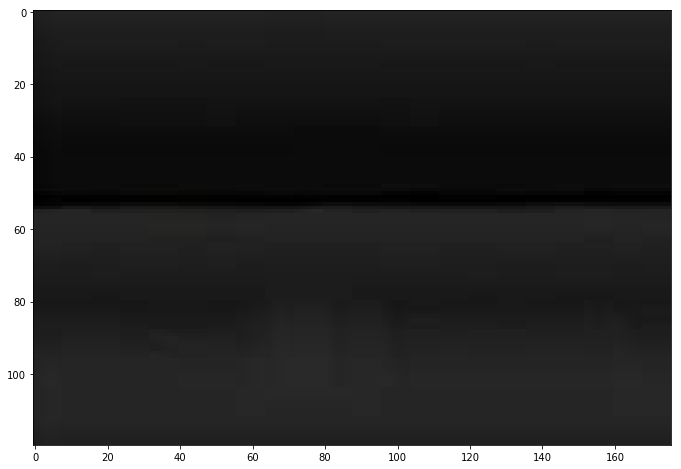

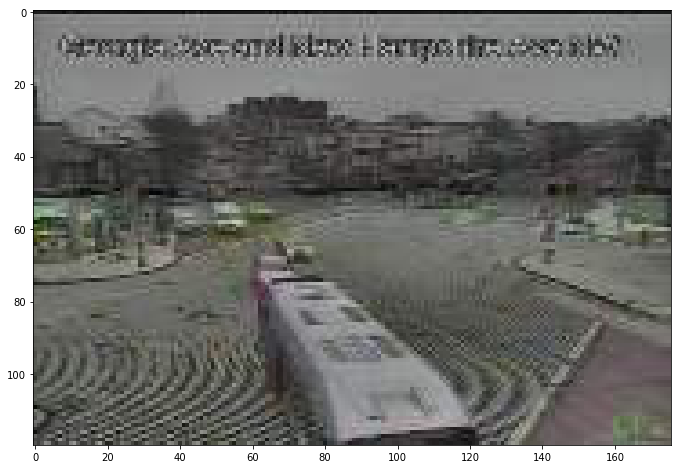

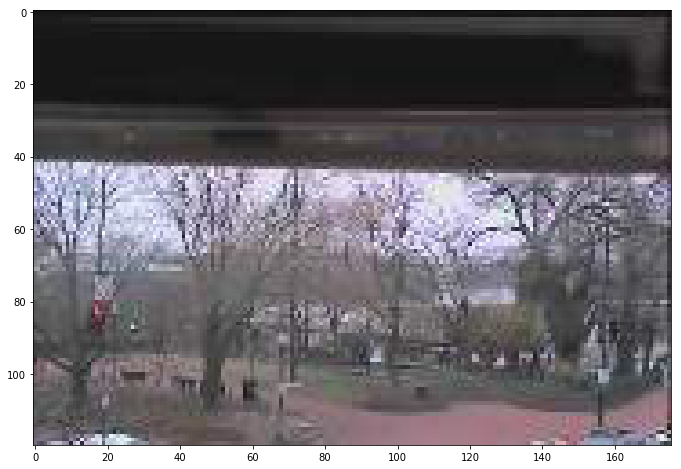

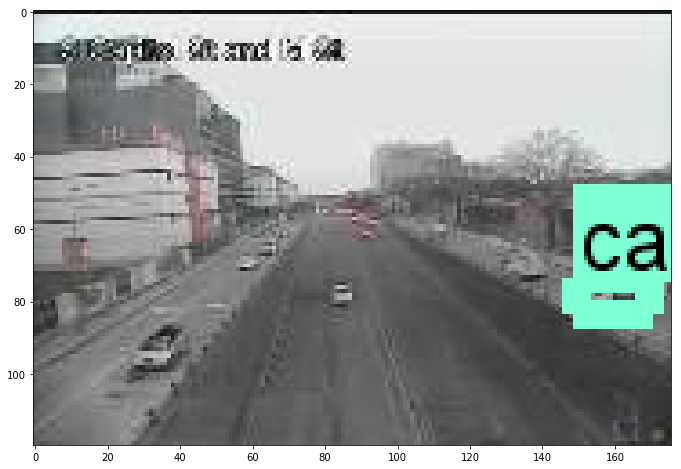

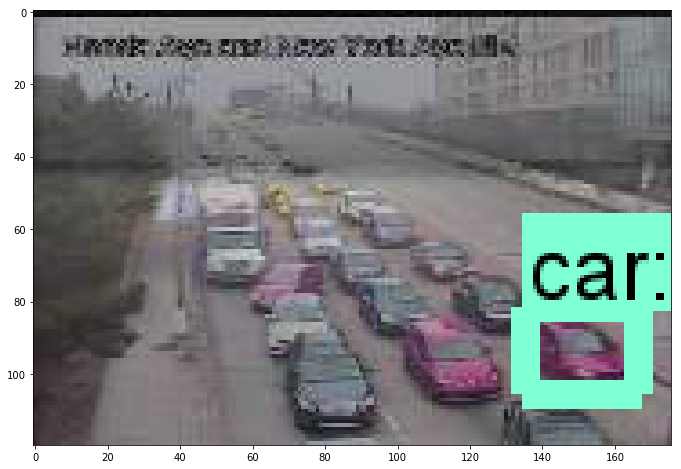

In [290]:
# %%time
with detection_graph.as_default():
    
    with tf.Session(graph=detection_graph) as sess:
        
        image_tensor = detection_graph.get_tensor_by_name('image_tensor:0')
        detection_boxes = detection_graph.get_tensor_by_name('detection_boxes:0')
        detection_scores = detection_graph.get_tensor_by_name('detection_scores:0')
        detection_classes = detection_graph.get_tensor_by_name('detection_classes:0')
        num_detections = detection_graph.get_tensor_by_name('num_detections:0')

        for camera_id in camera_img_nparrays_dict:

            # Retrieve camera information
            camera_lat = camera_img_nparrays_dict[camera_id]['camera_lat']
            camera_lon = camera_img_nparrays_dict[camera_id]['camera_lon']
            camera_name = camera_img_nparrays_dict[camera_id]['camera_name']
            image_np = camera_img_nparrays_dict[camera_id]['camera_img_nparr']
            image_np_expanded = camera_img_nparrays_dict[camera_id]['camera_img_nparrext']

            (boxes, scores, classes, num) = sess.run(
                  [detection_boxes, detection_scores, detection_classes, num_detections],
                  feed_dict={image_tensor: image_np_expanded})

            vis_util.visualize_boxes_and_labels_on_image_array(
                  image_np,
                  np.squeeze(boxes),
                  np.squeeze(classes).astype(np.int32),
                  np.squeeze(scores),
                  category_index,
                  use_normalized_coordinates=True,
                  line_thickness=8)

            car_count, people_count, bicycle_count, motorcycle_count, bus_count, truck_count = object_counter(np.squeeze(classes).astype(np.int32), np.squeeze(scores))
            vehicle_count = car_count + motorcycle_count + bus_count + truck_count
            total_count = vehicle_count + bicycle_count + people_count                

            print()
            print("Camera: {0}".format(camera_name))
            print("Car Count: {0}".format(car_count))

            symbol = {"color": [255,255,0,255], "size": car_count*2, "type": "esriSMS", "style": "esriSMSCircle"}

            jpeg_content = "<img src='{}' width='200px'/>".format(camera_jpeg_url)
#                 jpeg_content = "<img src='{}' width='200px'/>".format(plt.imshow(image_np))

            m2.draw({'x':camera_lon, 'y':camera_lat}, 
                   symbol=symbol, 
                   popup={'Name':camera_name, 'content': jpeg_content, 'cars': car_count})

            plt.figure(figsize=IMAGE_SIZE)
            plt.imshow(image_np)        

##### Option 1: Graphic Drawing from Model

In [338]:
m2 = gis.map('Ballston, VA', zoomlevel=11)
m2.basemap = 'streets-night-vector'
m2


Camera: New Hampshire Ave @ Georgia Ave 
Car Count: 1

Camera: M St @ Francis Scott Key Brdg
Car Count: 0

Camera: M St @ S Capitol St
Car Count: 5

Camera: Florida Ave @ New York Ave
Car Count: 6

Camera: Eastern Ave @ Kenilworth Ave
Car Count: 7

Camera: 4th St @ New York Ave
Car Count: 4

Camera: 14th St Brdg
Car Count: 6

Camera: Ist St @ Delaware Ave
Car Count: 0

Camera: Georgia Ave @ Irving St
Car Count: 6

Camera: 16th St @ U St
Car Count: 2

Camera: 16th St @ Columbia Rd
Car Count: 1

Camera: Georgia Ave @ Eastern Ave
Car Count: 0

Camera: 16th St @ Irving St
Car Count: 5

Camera: Georgia Ave @ Kansas Ave
Car Count: 0

Camera: S Capitol St @ Suitland Pkwy
Car Count: 0

Camera: Pennsylvania Ave @ SE Fwy
Car Count: 4

Camera: New York Ave @ Bladensburg Rd
Car Count: 5

Camera: Independence Ave @ 7th St
Car Count: 7

Camera: Connecticut Ave @ Calvert St
Car Count: 9

Camera: Maryland Ave @ H St & Benning Rd
Car Count: 3

Camera: Rhode Island Ave @ S Dakota Ave
Car Count: 8


C:\ProgramData\Anaconda3\lib\site-packages\matplotlib\pyplot.py:524: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)



Camera: E Capitol St @ Benning Rd
Car Count: 1

Camera: Benning Rd @ Minnesota Ave
Car Count: 0

Camera: Pennsylvania Ave @ 7th St
Car Count: 1


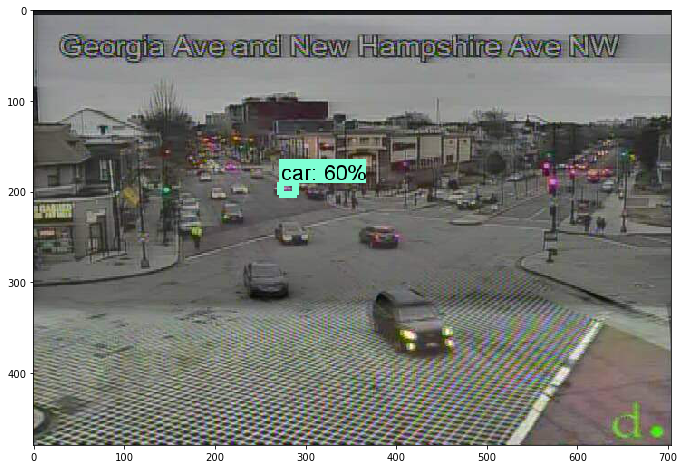

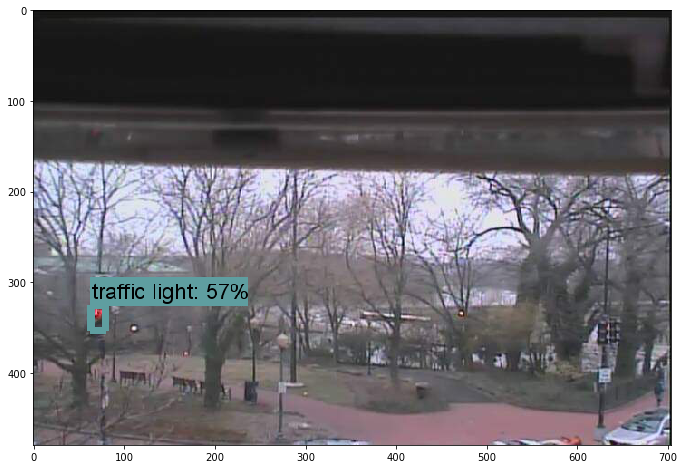

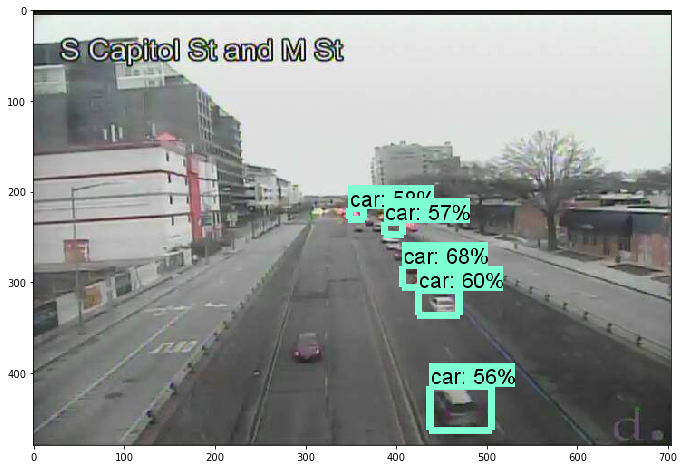

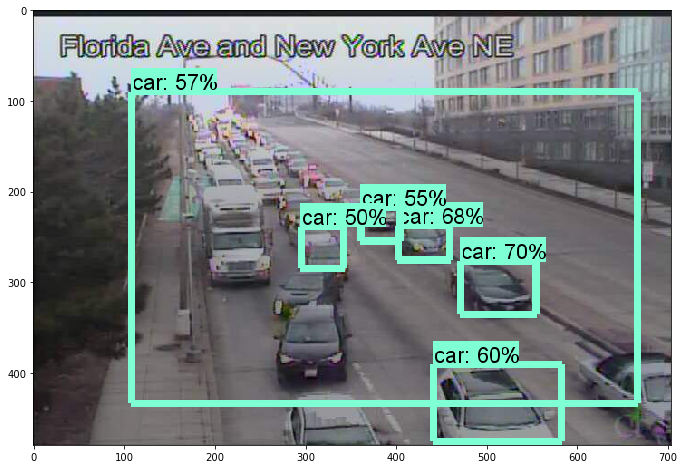

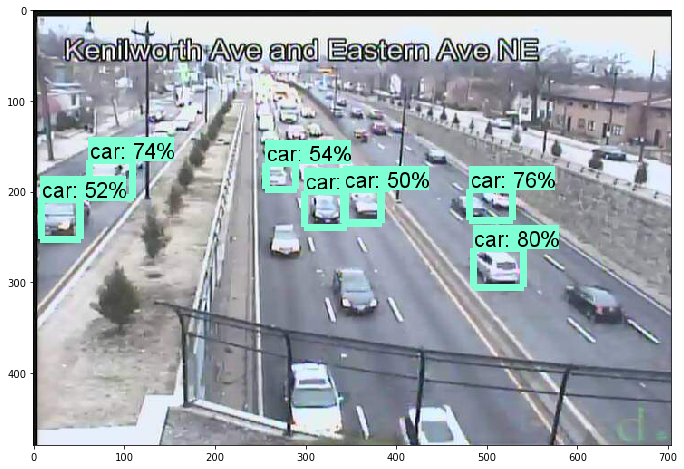

...

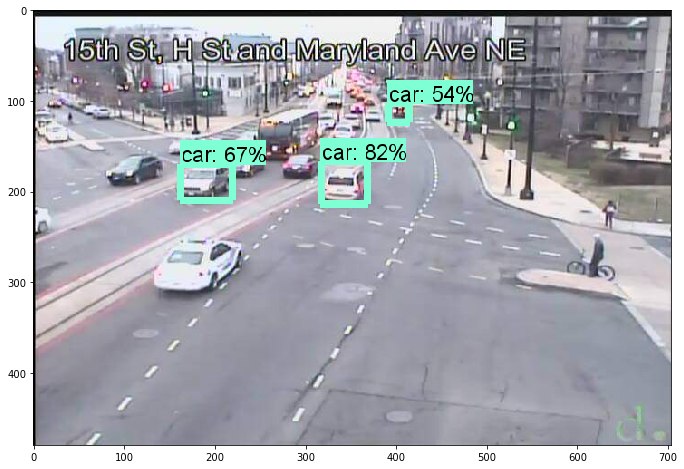

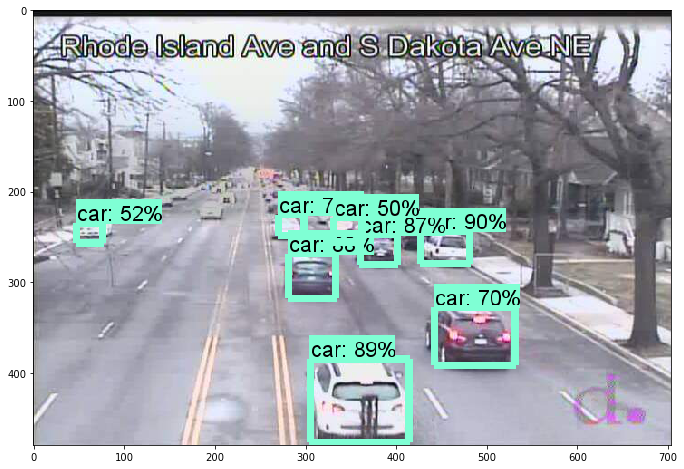

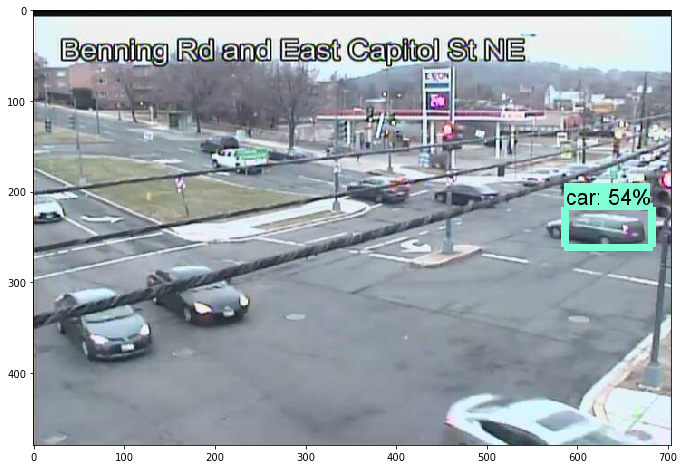

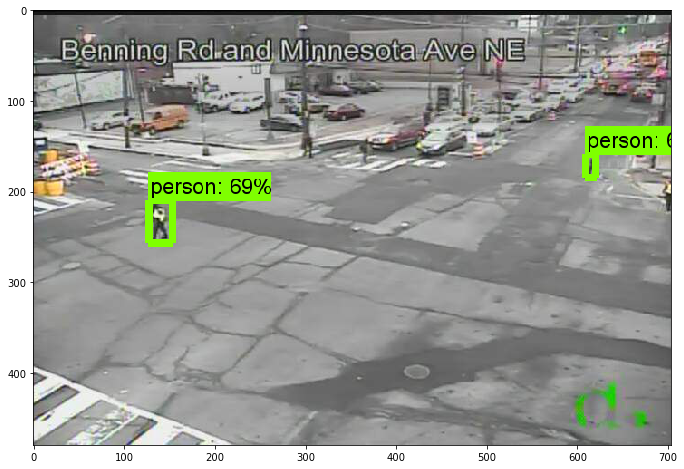

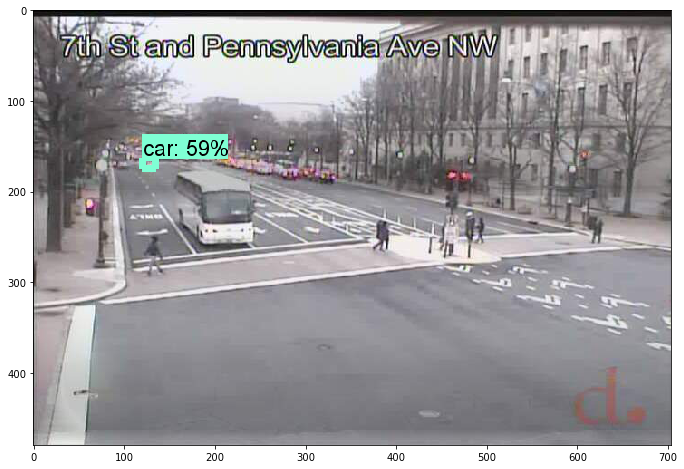

In [286]:
with detection_graph.as_default():
    
    with tf.Session(graph=detection_graph) as sess:
        
        image_tensor = detection_graph.get_tensor_by_name('image_tensor:0')
        detection_boxes = detection_graph.get_tensor_by_name('detection_boxes:0')
        detection_scores = detection_graph.get_tensor_by_name('detection_scores:0')
        detection_classes = detection_graph.get_tensor_by_name('detection_classes:0')
        num_detections = detection_graph.get_tensor_by_name('num_detections:0')

        for iteration in range(1):
            
            time.sleep(2)
            m.clear_graphics()
            
            for ix in range(1,25):

                # Retrieve camera information
                camera_jpeg_url = ddot_df.iloc[ix]['content']['hugeJpeg']
                camera_lat = ddot_df.iloc[ix]['location']['latitude']
                camera_lon = ddot_df.iloc[ix]['location']['longitude']
                camera_name = ddot_df.iloc[ix]['name']
                camera_id = ddot_df.iloc[ix]['publicId']
                

                # Retrieve the camera image
                camera_response = requests.get(camera_jpeg_url)

                image = Image.open(BytesIO(camera_response.content))
                image_np = load_image_into_numpy_array(image)
                image_np_expanded = np.expand_dims(image_np, axis=0)

                (boxes, scores, classes, num) = sess.run(
                      [detection_boxes, detection_scores, detection_classes, num_detections],
                      feed_dict={image_tensor: image_np_expanded})

                vis_util.visualize_boxes_and_labels_on_image_array(
                      image_np,
                      np.squeeze(boxes),
                      np.squeeze(classes).astype(np.int32),
                      np.squeeze(scores),
                      category_index,
                      use_normalized_coordinates=True,
                      line_thickness=8)
                
                car_count, people_count, bicycle_count, motorcycle_count, bus_count, truck_count = object_counter(np.squeeze(classes).astype(np.int32), np.squeeze(scores))
                vehicle_count = car_count + motorcycle_count + bus_count + truck_count
                total_count = vehicle_count + bicycle_count + people_count                
                
                print()
                print("Camera: {0}".format(camera_name))
                print("Car Count: {0}".format(car_count))
                
                symbol = {"color": [255,255,0,255], "size": car_count*2, "type": "esriSMS", "style": "esriSMSCircle"}
                
                jpeg_content = "<img src='{}' width='200px'/>".format(camera_jpeg_url)
#                 jpeg_content = "<img src='{}' width='200px'/>".format(plt.imshow(image_np))
                
                m.draw({'x':camera_lon, 'y':camera_lat}, 
                       symbol=symbol, 
                       popup={'title':camera_name, 'content': jpeg_content, 'cars': car_count})

                plt.figure(figsize=IMAGE_SIZE)
                plt.imshow(image_np)        

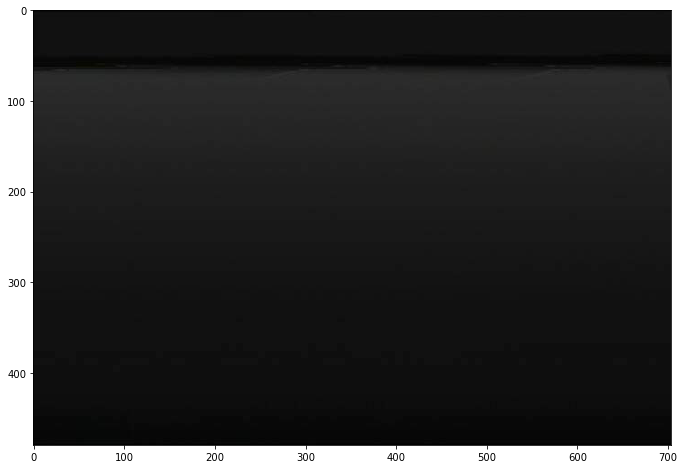

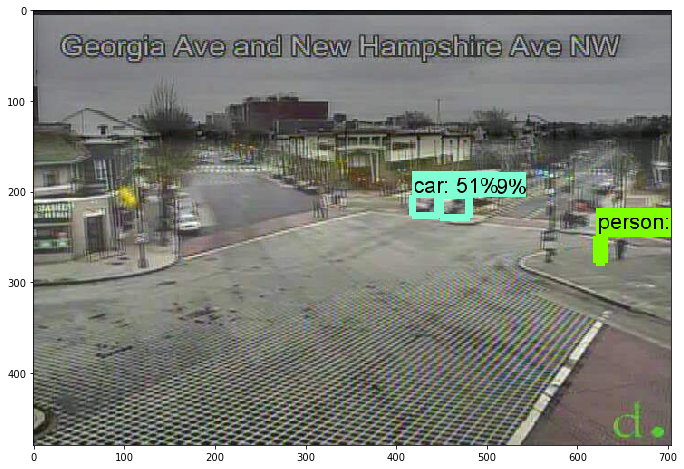

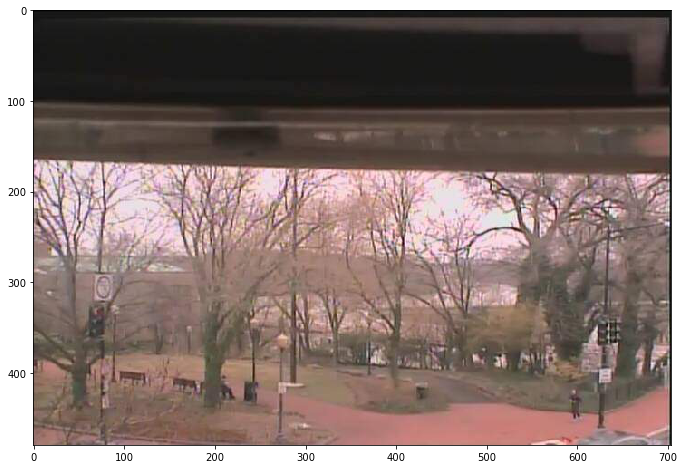

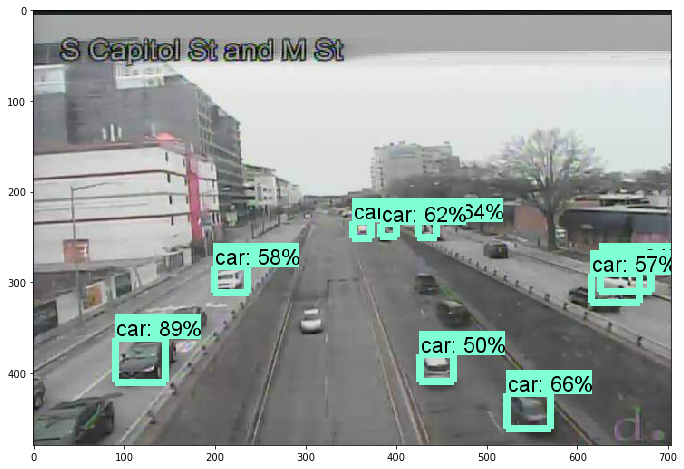

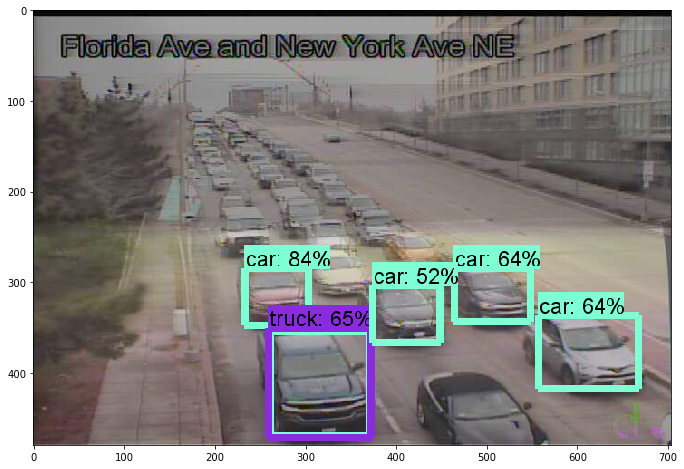

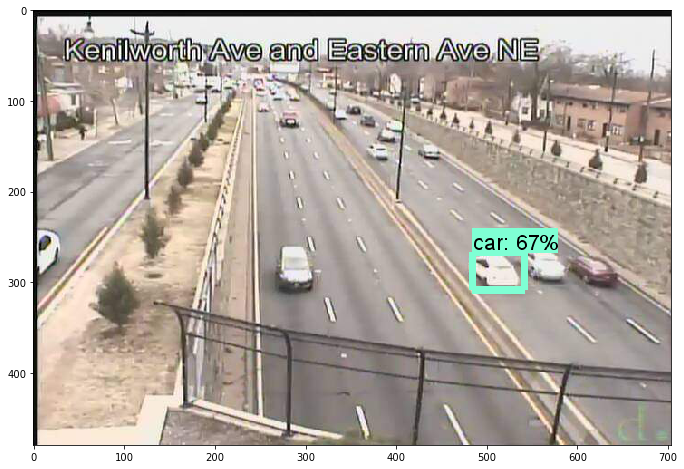

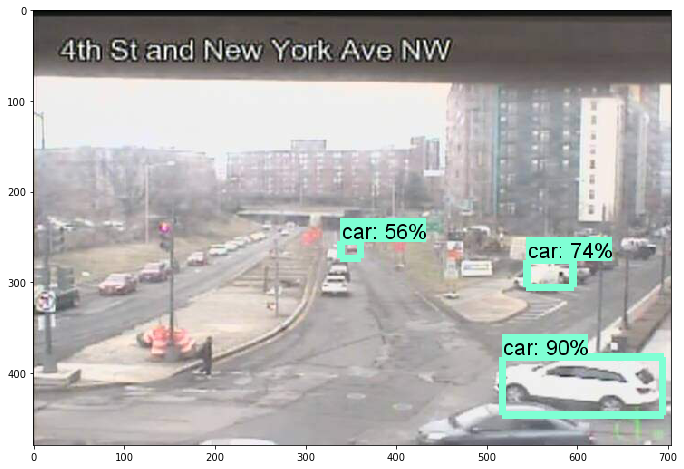

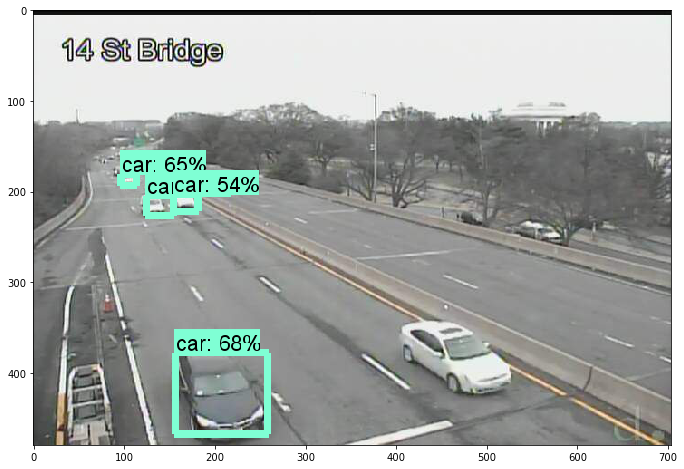

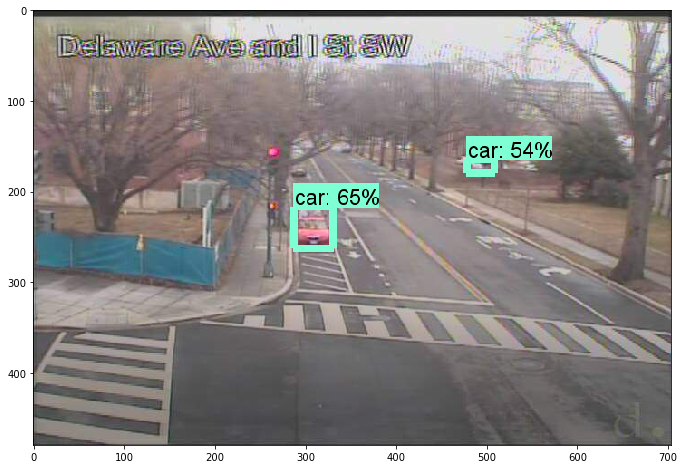

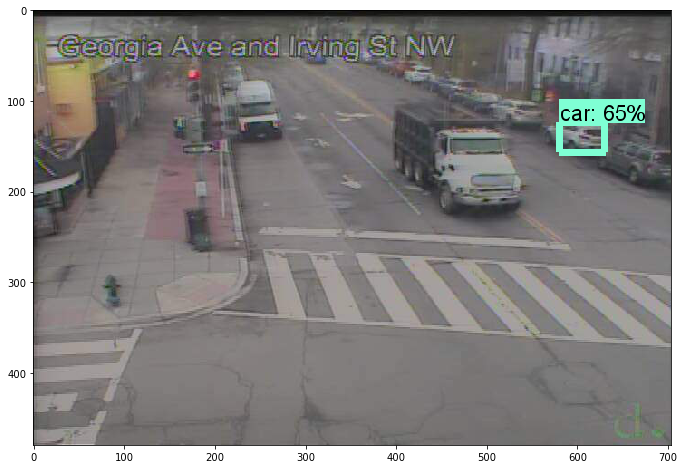

In [134]:
with detection_graph.as_default():
    
    with tf.Session(graph=detection_graph) as sess:
        
        image_tensor = detection_graph.get_tensor_by_name('image_tensor:0')
        detection_boxes = detection_graph.get_tensor_by_name('detection_boxes:0')
        detection_scores = detection_graph.get_tensor_by_name('detection_scores:0')
        detection_classes = detection_graph.get_tensor_by_name('detection_classes:0')
        num_detections = detection_graph.get_tensor_by_name('num_detections:0')

        for ix in range(10):

            # Retrieve camera information
            camera_jpeg_url = ddot_df.iloc[ix]['content']['hugeJpeg']
            camera_lat = ddot_df.iloc[ix]['location']['latitude']
            camera_lon = ddot_df.iloc[ix]['location']['longitude']
            camera_name = ddot_df.iloc[ix]['name']
            camera_id = ddot_df.iloc[ix]['publicid']
            
            # Retrieve the camera image
            camera_response = requests.get(camera_jpeg_url)
            
            image = Image.open(BytesIO(camera_response.content))
            image_np = load_image_into_numpy_array(image)
            image_np_expanded = np.expand_dims(image_np, axis=0)
            
            (boxes, scores, classes, num) = sess.run(
                  [detection_boxes, detection_scores, detection_classes, num_detections],
                  feed_dict={image_tensor: image_np_expanded})
            
            vis_util.visualize_boxes_and_labels_on_image_array(
                  image_np,
                  np.squeeze(boxes),
                  np.squeeze(classes).astype(np.int32),
                  np.squeeze(scores),
                  category_index,
                  use_normalized_coordinates=True,
                  line_thickness=8)
            
            plt.figure(figsize=IMAGE_SIZE)
            plt.imshow(image_np)        

#### Option 3: Use existing feature service and send model outputs as updates

In [333]:
gis

<Item title:"DDOT Traffic Cameras" type:Feature Layer Collection owner:albe9057@esri.com_esrifederal>
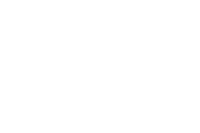

In [344]:
object_point_srvc = gis.content.search("DDOT Traffic Cameras", item_type="feature service")[0]
object_point_srvc

In [345]:
# Convert our existing service into a pandas dataframe
object_point_lyr = object_point_srvc.layers[0]
obj_fset = object_point_lyr.query()  #querying without any conditions returns all the features
obj_df = obj_fset.df
obj_df.head()

,F__OBJECTID,activity_timestamp,attribute_0,content,createdAt,description,latitude,longitude,name,orientation,...,rt_bus_count,rt_car_count,rt_motorcycle_count,rt_object_count,rt_pedestrian_count,rt_truck_count,rt_vehicle_count,status,updatedAt,SHAPE
0,1,None,None,{'halfJpeg': 'http://ie.trafficland.com/v1.0/2...,1420732661508,None,38.902599,-77.039233,K St @ 17th St & Conneticut Ave,WEST,...,0,0,0,0,0,0,0,"{'isDisabled': False, 'hasQualityWarning': True}",1473442821241,"{'x': -8575968, 'y': 4707729}"
1,2,None,None,{'halfJpeg': 'http://ie.trafficland.com/v1.0/2...,1410381553029,None,38.936701,-77.024232,New Hampshire Ave @ Georgia Ave,SOUTH,...,0,0,0,0,0,0,0,"{'isDisabled': False, 'hasQualityWarning': False}",1473442837977,"{'x': -8574298, 'y': 4712609}"
2,3,None,None,{'halfJpeg': 'http://ie.trafficland.com/v1.0/2...,1410381584896,None,38.905143,-77.068561,M St @ Francis Scott Key Brdg,WEST,...,0,0,0,0,0,0,0,"{'isDisabled': False, 'hasQualityWarning': False}",1473442847933,"{'x': -8579233, 'y': 4708093}"
3,4,None,None,{'halfJpeg': 'http://ie.trafficland.com/v1.0/2...,1420749104062,None,38.876366,-77.009061,M St @ S Capitol St,EAST,...,0,0,0,0,0,0,0,"{'isDisabled': False, 'hasQualityWarning': False}",1473442869524,"{'x': -8572609, 'y': 4703978}"
4,5,None,None,{'halfJpeg': 'http://ie.trafficland.com/v1.0/2...,1410381400497,None,38.909042,-77.004583,Florida Ave @ New York Ave,WEST,...,0,0,0,0,0,0,0,"{'isDisabled': False, 'hasQualityWarning': False}",1473442883854,"{'x': -8572111, 'y': 4708651}"


In [346]:
all_features = obj_fset.features
all_features

[{"geometry": {"x": -8575968, "y": 4707729}, "attributes": {"F__OBJECTID": 1, "attribute_0": null, "content": "{'halfJpeg': 'http://ie.trafficland.com/v1.0/200001/half?system=ddot&pubtoken=5f19b98c4398f7060e3b4064c43b099e586e79eb374970949ec31740e7bf2cf1&refreshRate=2000', 'fullJpeg': 'http://ie.trafficland.com/v1.0/200001/full?system=ddot&pubtoken=5f19b98c4398f7060e3b4064c43b099e586e79eb374970949ec31740e7bf2cf1&refreshRate=2000', 'hugeJpeg': 'http://ie.trafficland.com/v1.0/200001/huge?system=ddot&pubtoken=5f19b98c4398f7060e3b4064c43b099e586e79eb374970949ec31740e7bf2cf1&refreshRate=2000'}", "createdAt": 1420732661508, "description": null, "name": "K St @ 17th St & Conneticut Ave", "orientation": "WEST", "policy": "{'isAdmin': False, 'refreshRate': 2000}", "provider": "DDOT", "providerFullName": "District of Columbia DOT", "publicId": 200001, "status": "{'isDisabled': False, 'hasQualityWarning': True}", "updatedAt": 1473442821241, "latitude": 38.902599, "longitude": -77.039233, "rt_objec

In [347]:
from copy import deepcopy

original_feature = all_features[0]
feature_to_be_updated = deepcopy(original_feature)
feature_to_be_updated

{"geometry": {"x": -8575968, "y": 4707729}, "attributes": {"F__OBJECTID": 1, "attribute_0": null, "content": "{'halfJpeg': 'http://ie.trafficland.com/v1.0/200001/half?system=ddot&pubtoken=5f19b98c4398f7060e3b4064c43b099e586e79eb374970949ec31740e7bf2cf1&refreshRate=2000', 'fullJpeg': 'http://ie.trafficland.com/v1.0/200001/full?system=ddot&pubtoken=5f19b98c4398f7060e3b4064c43b099e586e79eb374970949ec31740e7bf2cf1&refreshRate=2000', 'hugeJpeg': 'http://ie.trafficland.com/v1.0/200001/huge?system=ddot&pubtoken=5f19b98c4398f7060e3b4064c43b099e586e79eb374970949ec31740e7bf2cf1&refreshRate=2000'}", "createdAt": 1420732661508, "description": null, "name": "K St @ 17th St & Conneticut Ave", "orientation": "WEST", "policy": "{'isAdmin': False, 'refreshRate': 2000}", "provider": "DDOT", "providerFullName": "District of Columbia DOT", "publicId": 200001, "status": "{'isDisabled': False, 'hasQualityWarning': True}", "updatedAt": 1473442821241, "latitude": 38.902599, "longitude": -77.039233, "rt_object

In [348]:
m3 = gis.map('Ballston, VA', zoomlevel=11)
m3.basemap = 'streets-night-vector'
m3

In [349]:
m3.add_layer(cameras_lyr)

In [ ]:
with detection_graph.as_default():
    
    with tf.Session(graph=detection_graph) as sess:
        
        image_tensor = detection_graph.get_tensor_by_name('image_tensor:0')
        detection_boxes = detection_graph.get_tensor_by_name('detection_boxes:0')
        detection_scores = detection_graph.get_tensor_by_name('detection_scores:0')
        detection_classes = detection_graph.get_tensor_by_name('detection_classes:0')
        num_detections = detection_graph.get_tensor_by_name('num_detections:0')

        for iteration in range(1):
            
            for ix in range(1,25):

                # Retrieve camera information
                camera_jpeg_url = ddot_df.iloc[ix]['content']['hugeJpeg']
                camera_lat = ddot_df.iloc[ix]['location']['latitude']
                camera_lon = ddot_df.iloc[ix]['location']['longitude']
                camera_name = ddot_df.iloc[ix]['name']
                camera_id = ddot_df.iloc[ix]['publicId']
                

                # Retrieve the camera image
                camera_response = requests.get(camera_jpeg_url)

                image = Image.open(BytesIO(camera_response.content))
                image_np = load_image_into_numpy_array(image)
                image_np_expanded = np.expand_dims(image_np, axis=0)

                (boxes, scores, classes, num) = sess.run(
                      [detection_boxes, detection_scores, detection_classes, num_detections],
                      feed_dict={image_tensor: image_np_expanded})

                vis_util.visualize_boxes_and_labels_on_image_array(
                      image_np,
                      np.squeeze(boxes),
                      np.squeeze(classes).astype(np.int32),
                      np.squeeze(scores),
                      category_index,
                      use_normalized_coordinates=True,
                      line_thickness=8)
                
                car_count, people_count, bicycle_count, motorcycle_count, bus_count, truck_count = object_counter(np.squeeze(classes).astype(np.int32), np.squeeze(scores))
                vehicle_count = car_count + motorcycle_count + bus_count + truck_count
                total_count = vehicle_count + bicycle_count + people_count                
                
                features_for_update = []
                feature_to_be_updated.attributes['RT_Object_Count'] = total_count
                feature_to_be_updated.attributes['RT_Vehicle_Count'] = vehicle_count
                feature_to_be_updated.attributes['RT_Car_Count'] = car_count
                feature_to_be_updated.attributes['RT_Bus_Count'] = bus_count
                feature_to_be_updated.attributes['RT_Truck_Count'] = truck_count
                feature_to_be_updated.attributes['RT_Motorcycle_Count'] = motorcycle_count
                feature_to_be_updated.attributes['RT_Pedestrian_Count'] = people_count
                feature_to_be_updated.attributes['RT_Bicycle_Count'] = bicycle_count

    #             feature_to_be_updated.attributes['rt_car_count'] = car_count
                features_for_update.append(feature_to_be_updated)
                object_point_lyr.edit_features(updates=features_for_update)    
                


Store image in temp workspace

In [16]:
# Store image in temp workspace


Convert image to numpy array or format that can be passed to model

In [17]:
# Convert image to numpy array or format that can be passed to model


Execute model on camera image

In [18]:
# Execute model on camera image


Retrieve outputs and prepare update request

In [19]:
# Retrieve outputs and prepare update request


Send update request

In [ ]:
# Send update request


# Establish Connection to ArcGIS Online via ArcGIS API for Python

#### Authenticate

In [164]:
import arcgis

In [334]:
portals_dict = {
    "esrifederal_gis": r"https://esrifederal.maps.arcgis.com",
    "natgov_gis": r"http://esri-natgov105.eastus.cloudapp.azure.com/arcgis",
    "dot_gis": r"http://dot.esri.com/portal",
    "dev_gis": r"http://govdev.eastus.cloudapp.azure.com/arcgis",
    "local_gis": r"https://anieto.esri.com/arcgis",
    "brett_gis": r"https://agsbase.dcwebgis.net/portal",
    "bill_gis": r"https://idt.esri.com/portal"
}

gis_url = portals_dict["esrifederal_gis"]

if gis_url == portals_dict["esrifederal_gis"]:
    gis_app_id = r"wt3QUR1M4eum0TVI"
    print("Attempting to log in to '{0}'...".format(gis_url))
    gis = arcgis.gis.GIS(gis_url, client_id=gis_app_id)
    print("Successfully logged in as: " + gis.properties.user.username)
else:
    gis_username = getpass.getpass(prompt="Username: ")
    gis_pw = getpass.getpass(prompt="Password: ")
    print("Attempting to log in to '{0}'...".format(gis_url))
    gis = arcgis.gis.GIS(gis_url, gis_username, gis_pw, verify_cert=False)
    print("Successfully logged in as: " + gis.properties.user.username)

Attempting to log in to 'https://esrifederal.maps.arcgis.com'...
Please sign in to your GIS and paste the code that is obtained below.
If a web browser does not automatically open, please navigate to the URL below yourself instead.
Opening web browser to navigate to: https://esrifederal.maps.arcgis.com/sharing/rest/oauth2/authorize?client_id=wt3QUR1M4eum0TVI&response_type=code&expiration=-1&redirect_uri=urn%3Aietf%3Awg%3Aoauth%3A2.0%3Aoob
Enter code obtained on signing in using SAML: ········
Successfully logged in as: albe9057@esri.com_esrifederal


### Retrieve the Object Detection Point Layer

<Item title:"JHWY_ML_Detection_02" type:Feature Layer Collection owner:albe9057@esri.com_esrifederal>
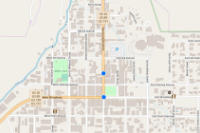

In [62]:
object_point_srvc = gis.content.search("JHWY_ML_Detection_02")[1]
object_point_srvc

In [63]:
# Convert our existing service into a pandas dataframe
object_point_lyr = object_point_srvc.layers[0]
obj_fset = object_point_lyr.query()  #querying without any conditions returns all the features
obj_df = obj_fset.df
obj_df.head()

,CreationDate,Creator,EditDate,Editor,OBJECTID,RT_Bicycle_Count,RT_Bus_Count,RT_Car_Count,RT_Motorcycle_Count,RT_Object_Count,RT_Pedestrian_Count,RT_Truck_Count,RT_Vehicle_Count,SHAPE
0,1512078543076,albe9057@esri.com_esrifederal,1519309661060,albe9057@esri.com_esrifederal,1,0,0,5,0,6,1,0,5,"{'x': -12330007.8039, 'y': 5385259.123000003}"


In [64]:
all_features = obj_fset.features
all_features

[{"geometry": {"x": -12330007.8039, "y": 5385259.123000003}, "attributes": {"OBJECTID": 1, "RT_Object_Count": 6, "RT_Vehicle_Count": 5, "RT_Car_Count": 5, "RT_Truck_Count": 0, "RT_Pedestrian_Count": 1, "RT_Bicycle_Count": 0, "RT_Motorcycle_Count": 0, "RT_Bus_Count": 0, "CreationDate": 1512078543076, "Creator": "albe9057@esri.com_esrifederal", "EditDate": 1519309661060, "Editor": "albe9057@esri.com_esrifederal"}}]

In [65]:
from copy import deepcopy

original_feature = all_features[0]
feature_to_be_updated = deepcopy(original_feature)
feature_to_be_updated

{"geometry": {"x": -12330007.8039, "y": 5385259.123000003}, "attributes": {"OBJECTID": 1, "RT_Object_Count": 6, "RT_Vehicle_Count": 5, "RT_Car_Count": 5, "RT_Truck_Count": 0, "RT_Pedestrian_Count": 1, "RT_Bicycle_Count": 0, "RT_Motorcycle_Count": 0, "RT_Bus_Count": 0, "CreationDate": 1512078543076, "Creator": "albe9057@esri.com_esrifederal", "EditDate": 1519309661060, "Editor": "albe9057@esri.com_esrifederal"}}

# Detection

In [66]:
# logging = "verbose"  # Options: verbose | simple | cars
# logging = "simple"
# logging = "cars"
logging = "none"

# ArcGIS API for Python and TensorFlow Deep Learning Model

## Start Model Detection

In [21]:
# Top left config
with detection_graph.as_default():
    with tf.Session(graph=detection_graph) as sess:
        # Definite input and output Tensors for detection_graph
        image_tensor = detection_graph.get_tensor_by_name('image_tensor:0')
        # Each box represents a part of the image where a particular object was detected.
        detection_boxes = detection_graph.get_tensor_by_name('detection_boxes:0')
        # Each score represent how level of confidence for each of the objects.
        # Score is shown on the result image, together with the class label.
        detection_scores = detection_graph.get_tensor_by_name('detection_scores:0')
        detection_classes = detection_graph.get_tensor_by_name('detection_classes:0')
        num_detections = detection_graph.get_tensor_by_name('num_detections:0')
        while True:
            
            # Expand dimensions since the model expects images to have shape: [1, None, None, 3]
            image_np = np.array(ImageGrab.grab(bbox=(0,424,683,768)))
            image_np_expanded = np.expand_dims(image_np, axis=0)
            # Actual detection.
            (boxes, scores, classes, num) = sess.run(
              [detection_boxes, detection_scores, detection_classes, num_detections],
              feed_dict={image_tensor: image_np_expanded})
            
#             print(np.squeeze(classes))
            # Visualization of the results of a detection.
            vis_util.visualize_boxes_and_labels_on_image_array(
              image_np,
              np.squeeze(boxes),
              np.squeeze(classes).astype(np.int32),
              np.squeeze(scores),
              category_index,
              use_normalized_coordinates=True,
              line_thickness=8, min_score_thresh=0.5)
            
#             cv2.imshow('object detection', cv2.resize(image_np, (960,560)))
            cv2.imshow('object detection', cv2.resize(image_np, (683,344), interpolation=cv2.INTER_CUBIC))
            if cv2.waitKey(25) & 0xFF == ord('q'):
                cv2.destroyAllWindows()
                break
                
            car_count, people_count, bicycle_count, motorcycle_count, bus_count, truck_count = object_counter(np.squeeze(classes).astype(np.int32), np.squeeze(scores))
            vehicle_count = car_count + motorcycle_count + bus_count + truck_count
            total_count = vehicle_count + bicycle_count + people_count
        
            if logging == "verbose":
                print("/n")
                print("Detected {0} total objects...".format(str(total_count)))
                print("Detected {0} total vehicles...".format(str(vehicle_count)))
                print("Detected {0} cars...".format(str(car_count)))
                print("Detected {0} motorcycles...".format(str(motorcycle_count)))
                print("Detected {0} buses...".format(str(bus_count)))
                print("Detected {0} trucks...".format(str(truck_count)))
                print("Detected {0} pedestrians...".format(str(people_count)))
                print("Detected {0} bicycles...".format(str(bicycle_count)))
            
            elif logging == "simple":
                print("/n")
                print("Detected {0} total objects...".format(str(total_count)))
                print("Detected {0} total vehicles...".format(str(vehicle_count)))
                print("Detected {0} pedestrians...".format(str(people_count)))
                print("Detected {0} bicycles...".format(str(bicycle_count)))
                
            elif logging == "cars":
                print("/n")
                print("Detected {0} cars...".format(str(car_count)))
                
            elif logging == "none":
                pass
            
            features_for_update = []
            feature_to_be_updated.attributes['RT_Object_Count'] = total_count
            feature_to_be_updated.attributes['RT_Vehicle_Count'] = vehicle_count
            feature_to_be_updated.attributes['RT_Car_Count'] = car_count
            feature_to_be_updated.attributes['RT_Bus_Count'] = bus_count
            feature_to_be_updated.attributes['RT_Truck_Count'] = truck_count
            feature_to_be_updated.attributes['RT_Motorcycle_Count'] = motorcycle_count
            feature_to_be_updated.attributes['RT_Pedestrian_Count'] = people_count
            feature_to_be_updated.attributes['RT_Bicycle_Count'] = bicycle_count
            
#             feature_to_be_updated.attributes['rt_car_count'] = car_count
            features_for_update.append(feature_to_be_updated)
            object_point_lyr.edit_features(updates=features_for_update)                

# Top left config
with detection_graph.as_default():
    with tf.Session(graph=detection_graph) as sess:
        # Definite input and output Tensors for detection_graph
        image_tensor = detection_graph.get_tensor_by_name('image_tensor:0')
        # Each box represents a part of the image where a particular object was detected.
        detection_boxes = detection_graph.get_tensor_by_name('detection_boxes:0')
        # Each score represent how level of confidence for each of the objects.
        # Score is shown on the result image, together with the class label.
        detection_scores = detection_graph.get_tensor_by_name('detection_scores:0')
        detection_classes = detection_graph.get_tensor_by_name('detection_classes:0')
        num_detections = detection_graph.get_tensor_by_name('num_detections:0')
        while True:
            
            # Expand dimensions since the model expects images to have shape: [1, None, None, 3]
            image_np = np.array(ImageGrab.grab(bbox=(0,160,960,720)))
            image_np_expanded = np.expand_dims(image_np, axis=0)
            # Actual detection.
            (boxes, scores, classes, num) = sess.run(
              [detection_boxes, detection_scores, detection_classes, num_detections],
              feed_dict={image_tensor: image_np_expanded})
            
#             print(np.squeeze(classes))
            # Visualization of the results of a detection.
            vis_util.visualize_boxes_and_labels_on_image_array(
              image_np,
              np.squeeze(boxes),
              np.squeeze(classes).astype(np.int32),
              np.squeeze(scores),
              category_index,
              use_normalized_coordinates=True,
              line_thickness=8, min_score_thresh=0.5)
            
            cv2.imshow('object detection', cv2.resize(image_np, (960,560)))
            if cv2.waitKey(25) & 0xFF == ord('q'):
                cv2.destroyAllWindows()
                break
                
            car_count = car_counter(np.squeeze(classes).astype(np.int32), np.squeeze(scores))
            print("Detected {0} cars...".format(str(car_count)))
            
            features_for_update = []
            feature_to_be_updated.attributes['RT_Car_Count'] = car_count
#             feature_to_be_updated.attributes['rt_car_count'] = car_count
            features_for_update.append(feature_to_be_updated)
            object_point_lyr.edit_features(updates=features_for_update)                